# Import packages

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) #Set scaling for the jupyter notebook cell width - make them bigger

/tmp/ipykernel_1866/3983057131.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
#General packages
from IPython.display import clear_output #import of a single funtcion
import sys #system related packages
import os #better path and file handling
import pickle #saving and loading objects

#Tables, numbers etc
import pandas as pd #tables
import numpy as np #arrays
import scipy #sciency functions
from sklearn import mixture #For gaussian mixture model

#Plotting packages
import matplotlib.pyplot as plt #Main plotting
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
import seaborn as sbn #nicer plots

#RNA-seq analysis
import scanpy as sc #Main package for scRNA-seq analysis
import scanpy.external as sce #some more functions for scanpy
import bbknn #batch correction


root = '/mnt/c' if 'mnt' in os.getcwd() else 'C:' #root path depending on which environment I use

#Import some custom helper functions for plotting
path_skin_scripts = '{}/Users/karlan/Documents/Python/Projects'.format(root)
sys.path.append(path_skin_scripts)
from Skin_scripts import *

In [3]:
cell_cycle_genes_path = '{}/Documents and Settings/karlan/Documents/Files_for_Ubuntu/regev_lab_cell_cycle_genes.txt'.format(root)

cell_cycle_genes = [x.strip().title() for x in open(cell_cycle_genes_path)]

# Separate dataset for S-phase or G2M-phase associated genes
s_genes = [x for x in cell_cycle_genes[:43]]
g2m_genes = [x for x in cell_cycle_genes[43:]]"""

In [4]:
path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Sara and Nur/Loom files'.format(root)
filename = 'HMU_validation.loom'

In [5]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)

In [6]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str)
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [17]:
adata

AnnData object with n_obs × n_vars = 30951 × 15985
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo', 'S_score', 'G2M_score', 'phase'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [8]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

... storing 'orig.ident' as categorical
... storing 'seurat_clusters' as categorical


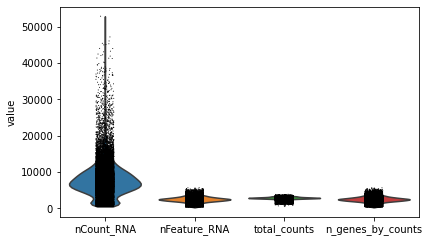

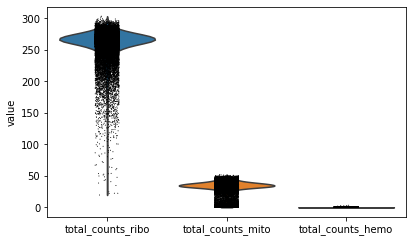

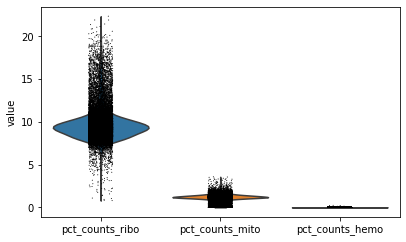

In [9]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

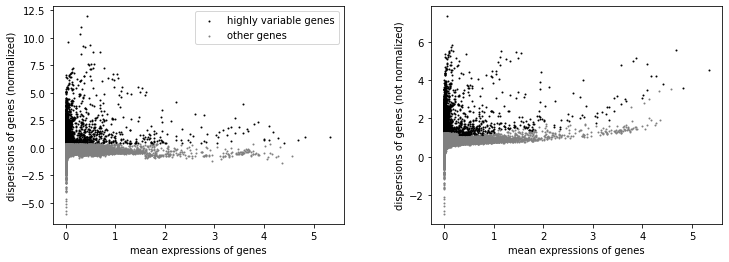

In [10]:
sc.pp.highly_variable_genes(adata, n_top_genes = 4000)
sc.pl.highly_variable_genes(adata)

In [11]:
adata.raw = adata

In [12]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

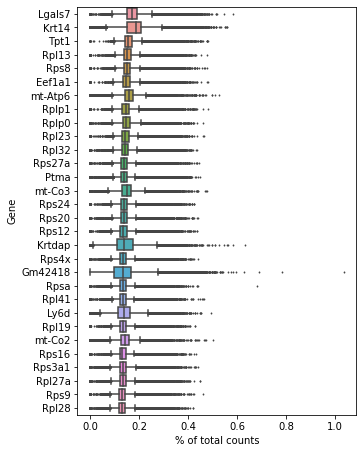

In [13]:
sc.pl.highest_expr_genes(adata)

In [14]:
sc.pp.scale(adata)

In [15]:
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

In [16]:
sc.pp.pca(adata)
#sc.pp.neighbors(adata)
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata)

... storing 'phase' as categorical


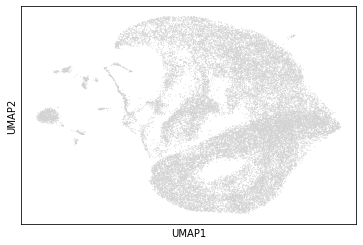

In [18]:
sc.pl.umap(adata)

In [19]:
sc.tl.leiden(adata, resolution = 0.3)

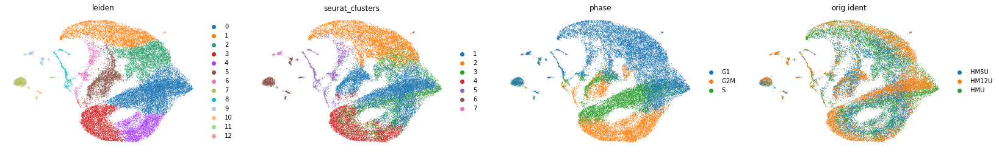

In [20]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'], frameon = False)

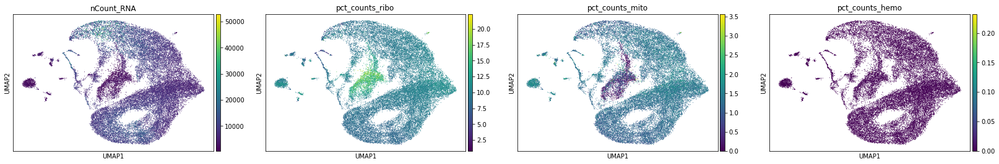

In [21]:
sc.pl.umap(adata, color = ['nCount_RNA', 'pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

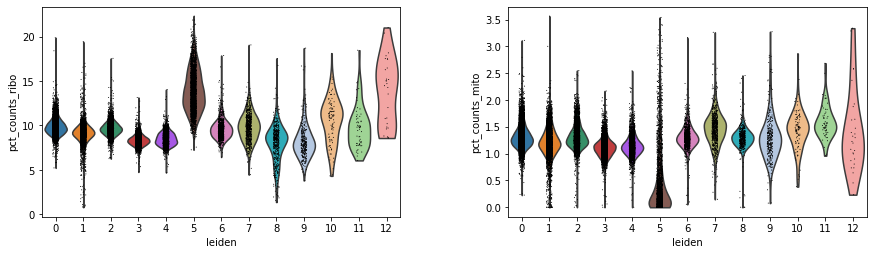

In [22]:
sc.pl.violin(adata, keys = ['pct_counts_ribo', 'pct_counts_mito'], groupby='leiden')

In [23]:
sum(adata.obs['leiden']=='5')

2723

In [24]:
sum(adata.obs['leiden']!='5')

28228

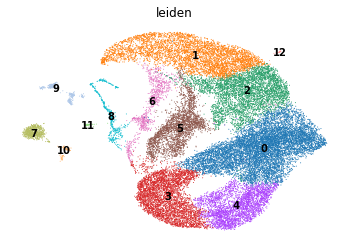

In [25]:
#sc.tl.leiden(adata, resolution = 0.5)
#sc.pl.umap(adata, color = ['leiden'])
sc.pl.umap(adata, color = ['leiden'], legend_loc='on data', frameon = False)

ax = axes[ix // ncols, ix % ncols]


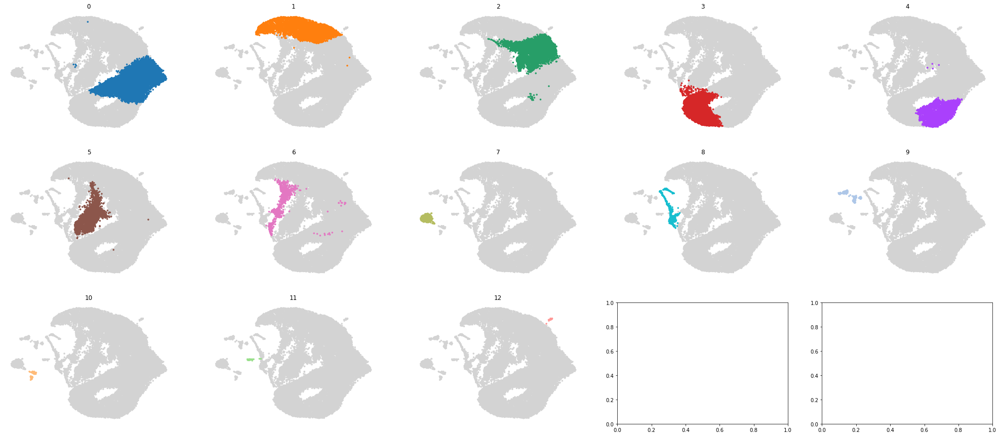

In [26]:
groups = adata.obs['leiden'].unique()
ncols = 5
fig, axes = initialize_subplots(len(groups), ncols = ncols)

for ix, g in enumerate(sorted(groups, key = lambda x: int(x))):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'leiden', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)

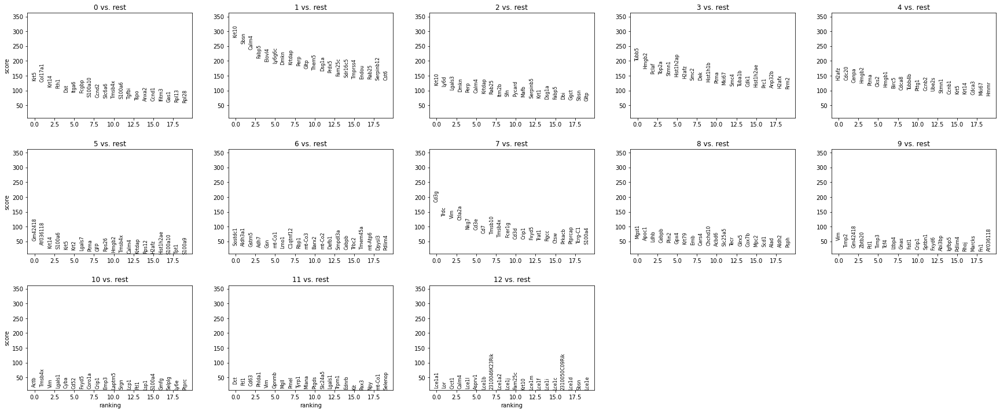

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Krt5,Krt10,Krt10,Tubb5,H2afz,Gm42418,Sostdc1,Cd3g,Mgst1,Vim,Actb,Dct,Lce1a1
1,Col17a1,Sbsn,Ly6d,Hmgb2,Cdc20,AY036118,Aldh3a1,Trdc,Apoc1,Timp2,Tmsb4x,Ftl1,Lor
2,Krt14,Calm4,Lgals3,Pclaf,Cenpa,Krt14,Gstm5,Vim,Ldhb,Gm42418,Vim,Cd63,Crct1
3,Fth1,Fabp5,Dmkn,Top2a,Hmgb2,S100a6,Adh7,Ctla2a,Cebpb,Zbtb20,Lgals1,Phlda1,Calm4
4,Dst,Elovl4,Perp,Stmn1,Ptma,Krt5,Gsn,Nkg7,Plin2,Ftl1,Cyba,Vim,Lce1l
5,Itga6,Ly6g6c,Calm4,Hist1h2ap,Cks2,Krt2,mt-Co1,Cd3e,Gpx4,Timp3,Cd52,Gpnmb,Asprv1
6,Fcgbp,Dmkn,Krtdap,H2afz,Hmgb1,Lgals7,Lmo1,Cd7,Krt79,Tcf4,Fxyd5,Mgll,Lce1b
7,S100a10,Krtdap,Rab25,Smc2,Birc5,Ptma,C1qtnf12,Tmsb10,Emb,Ltbp4,Coro1a,Pmel,2310046K23Rik
8,Ccnd2,Perp,Itm2b,Dek,Cdca8,GFP,Rbp1,Tmsb4x,Cers4,Gnas,Crip1,Tyrp1,Lce1a2
9,Slc6a6,Gltp,Sfn,Hist1h1b,Tubb4b,Rps26,mt-Co3,Fcer1g,Chchd10,Fstl1,Emp3,Mlana,Lce1j


In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

In [28]:
groups = ['0','1','2','3','4','12']

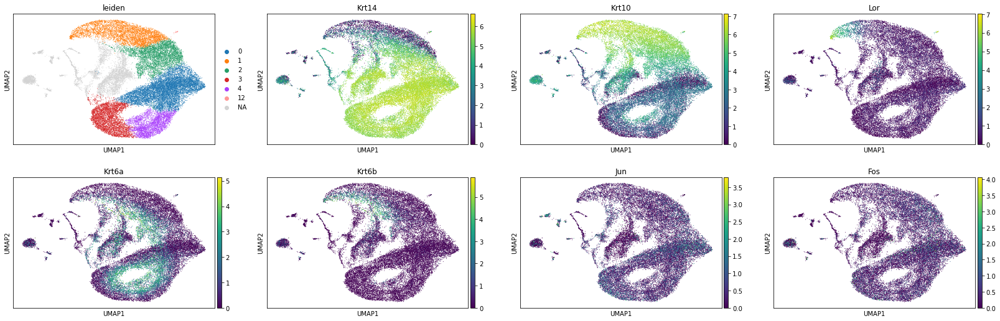

In [29]:
sc.pl.umap(adata, color = ['leiden', 'Krt14','Krt10','Lor', 'Krt6a','Krt6b','Jun','Fos'], groups = groups, ncols = 4)

In [30]:
adata = adata[adata.obs['leiden'].isin(groups)].copy()

In [31]:
adata

AnnData object with n_obs × n_vars = 25598 × 15985
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'seur

In [35]:
HMU_IFE_cells = adata.obs_names

In [36]:
%store HMU_IFE_cells

Stored 'HMU_IFE_cells' (Index)


# Read in raw data for IFE cells

In [5]:
%store -r

In [6]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)[HMU_IFE_cells]

In [7]:
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

Trying to set attribute `.var` of view, copying.


In [8]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

In [9]:
adata

AnnData object with n_obs × n_vars = 25598 × 18634
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

... storing 'orig.ident' as categorical


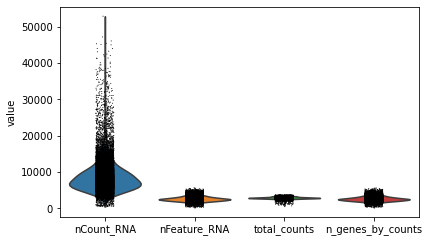

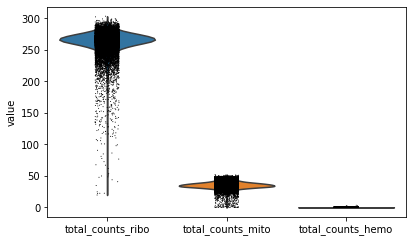

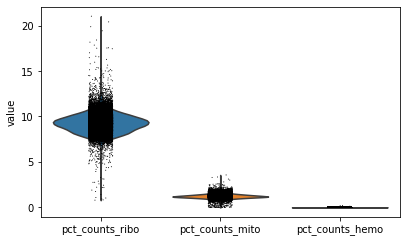

In [10]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

In [11]:
adata.raw = adata

In [12]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

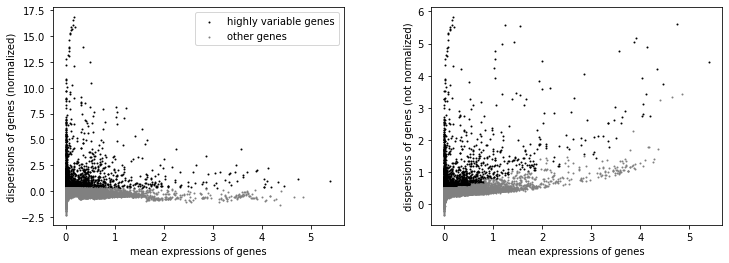

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.pl.highly_variable_genes(adata)

In [14]:
sc.pp.scale(adata)

In [15]:
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

In [16]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

... storing 'phase' as categorical


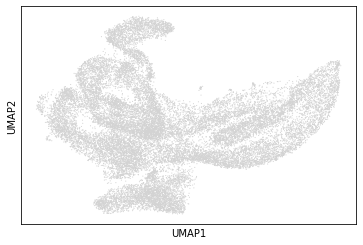

In [17]:
sc.pl.umap(adata)

In [18]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str)

In [19]:
sc.tl.leiden(adata, resolution = 0.4)

... storing 'seurat_clusters' as categorical


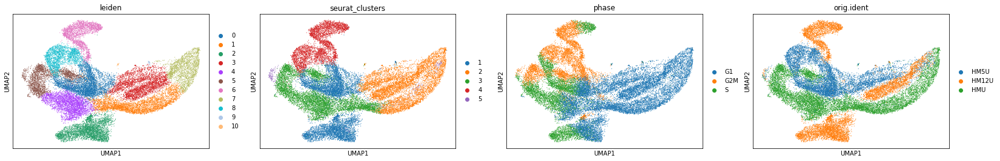

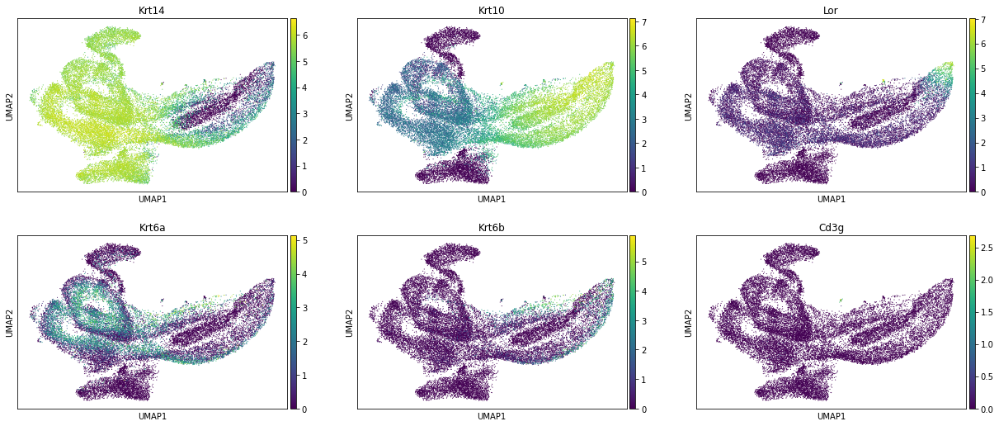

In [20]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'])
sc.pl.umap(adata, color = ['Krt14','Krt10','Lor','Krt6a','Krt6b','Cd3g'], ncols = 3)

In [21]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key = 'orig.ident')
sc.tl.umap(adata)

In [22]:
sc.tl.leiden(adata, resolution = 0.3)

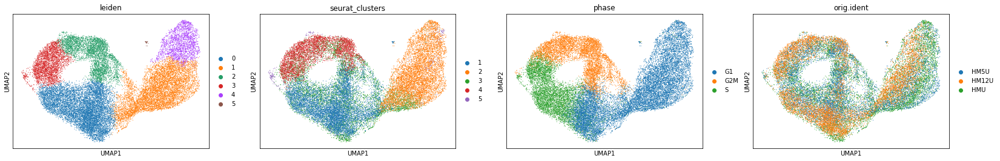

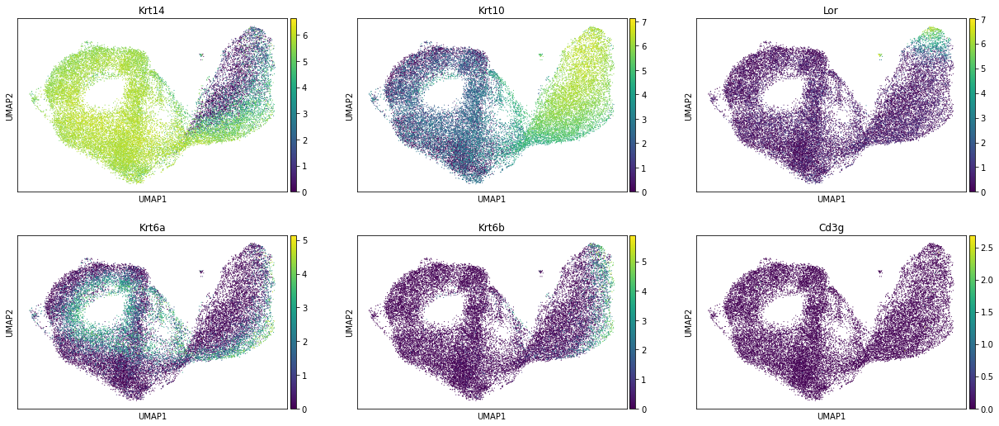

In [23]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'])
sc.pl.umap(adata, color = ['Krt14','Krt10','Lor','Krt6a','Krt6b','Cd3g'], ncols = 3)

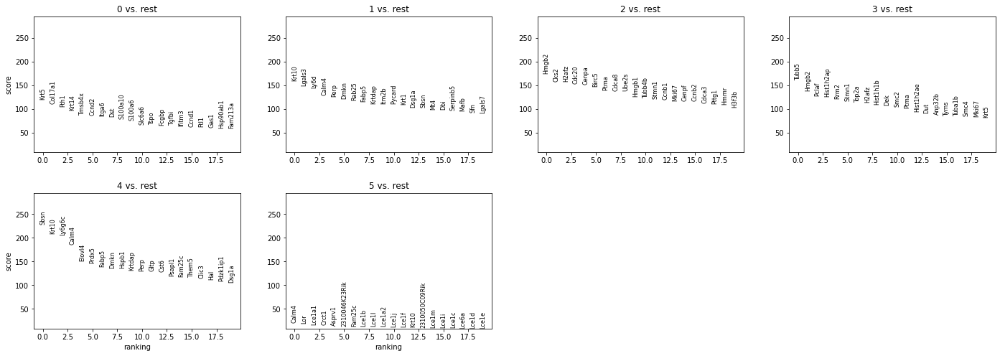

,0,1,2,3,4,5
0,Krt5,Krt10,Hmgb2,Tubb5,Sbsn,Calm4
1,Col17a1,Lgals3,Cks2,Hmgb2,Krt10,Lor
2,Fth1,Ly6d,H2afz,Pclaf,Ly6g6c,Lce1a1
3,Krt14,Calm4,Cdc20,Hist1h2ap,Calm4,Crct1
4,Tmsb4x,Perp,Cenpa,Rrm2,Elovl4,Asprv1
5,Ccnd2,Dmkn,Birc5,Stmn1,Prdx5,2310046K23Rik
6,Itga6,Rab25,Ptma,Top2a,Fabp5,Fam25c
7,Dst,Fabp5,Cdca8,H2afz,Dmkn,Lce1b
8,S100a10,Krtdap,Ube2s,Hist1h1b,Hspb1,Lce1l
9,S100a6,Itm2b,Hmgb1,Dek,Krtdap,Lce1a2


In [24]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

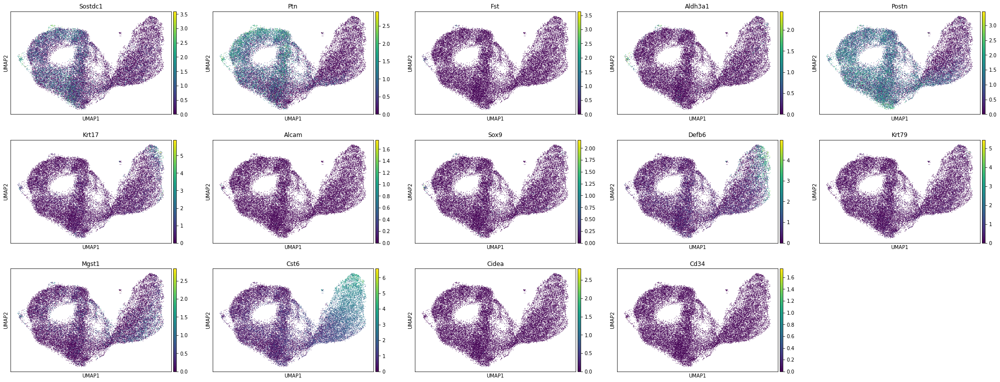

In [25]:
infu = ['Sostdc1','Ptn','Fst','Aldh3a1','Postn','Krt17','Alcam','Sox9','Defb6','Krt79','Mgst1','Cst6', 'Cidea', 'Cd34']
sc.pl.umap(adata, color = infu, ncols = 5, use_raw = True)

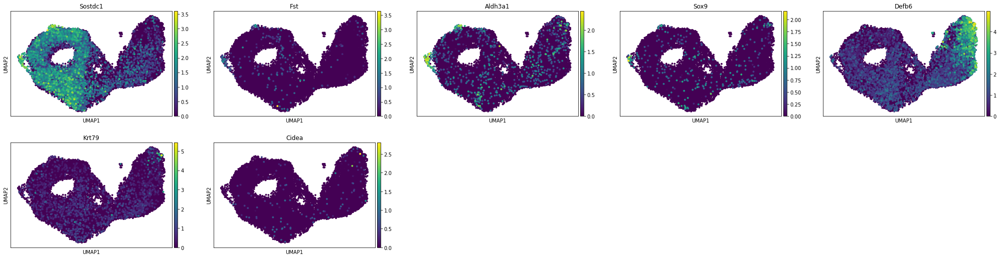

In [26]:
infu = ['Sostdc1','Fst','Aldh3a1','Sox9','Defb6','Krt79', 'Cidea']
sc.pl.umap(adata, color = infu, ncols = 5, use_raw = True, s = 60)

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='stress_score', ylabel='Density'>

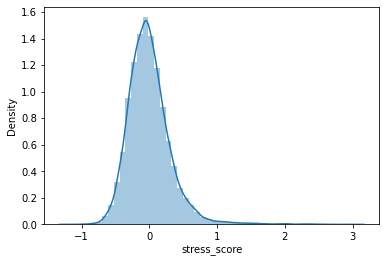

In [27]:
genes = ['Fosb', 'Fos', 'Jun', 'Junb', 'Jund', 'Atf3', 'Egr1', 'Hspa1a', 'Hspa1b', 'Hsp90ab1', 'Hspa8', 'Hspb1', 'Ier3', 'Ier2', 'Btg1', 'Btg2', 'Dusp1']
sc.tl.score_genes(adata, gene_list = genes, score_name = 'stress_score', use_raw = False)
sbn.distplot(adata.obs['stress_score'])

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='imm_score', ylabel='Density'>

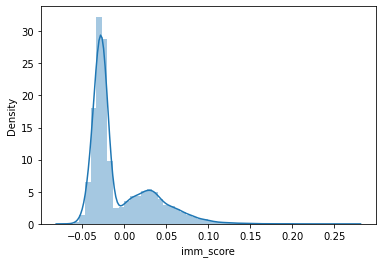

In [28]:
imm_genes = ['Cd74','Cd207','Tyrobp','Cd3e','Ptprc', 'Thy1','C1qa','Cd209f','Ccl6','Lyz1','Ly6c2','Emilin2','Cd209a','Mfge8']
sc.tl.score_genes(adata, gene_list = imm_genes, score_name = 'imm_score', use_raw = True)
sbn.distplot(adata.obs['imm_score'])

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='infu_score', ylabel='Density'>

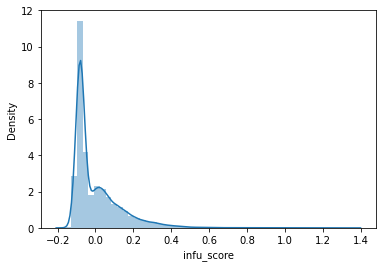

In [29]:
infu_genes = ['Sostdc1','Fst','Aldh3a1','Sox9','Defb6','Krt79', 'Cidea']
sc.tl.score_genes(adata, gene_list = infu_genes, score_name = 'infu_score', use_raw = True)
sbn.distplot(adata.obs['infu_score'])

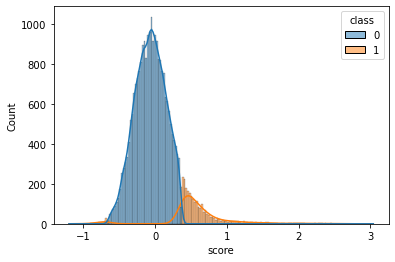

In [30]:
from sklearn import mixture
x = adata.obs['stress_score'].values.reshape(-1,1)
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Stress'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy')

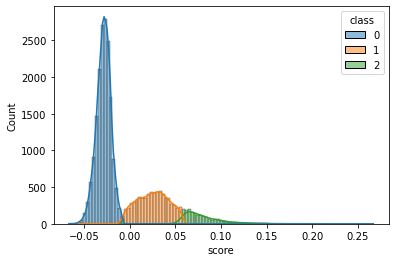

In [31]:
x = adata.obs['imm_score'].values.reshape(-1,1)
components = 3
gmm = mixture.GaussianMixture(n_components=components, covariance_type='full', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Immune'] = np.where(tmp.loc[adata.obs_names, 'class']>1, 'Immune', 'Non-immune')

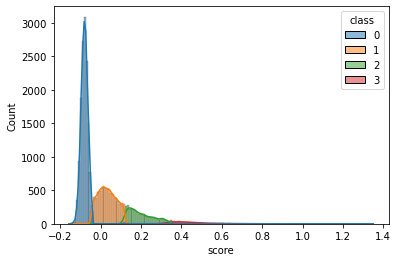

In [32]:
x = adata.obs['infu_score'].values.reshape(-1,1)
components = 4
gmm = mixture.GaussianMixture(n_components=components, covariance_type='full', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Infu'] = np.where(tmp.loc[adata.obs_names, 'class']>1, 'Infu', 'IFE')

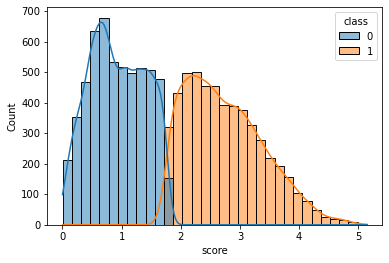

In [33]:
gene = 'Krt6a'
x = adata.raw[:, gene].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0]
x = adata.raw[pos_cells][:, gene].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

#adata.obs['Tomato'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy')
adata.obs['{}_class'.format(gene)] = ['{}-'.format(gene) if x not in tmp.index else '{} dim'.format(gene) if tmp.loc[x, 'class']==0 else '{}+'.format(gene) for x in adata.obs_names]

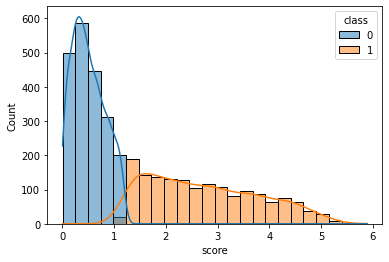

In [34]:
gene = 'Krt6b'
x = adata.raw[:, gene].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0]
x = adata.raw[pos_cells][:, gene].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

#adata.obs['Tomato'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy')
adata.obs['{}_class'.format(gene)] = ['{}-'.format(gene) if x not in tmp.index else '{} dim'.format(gene) if tmp.loc[x, 'class']==0 else '{}+'.format(gene) for x in adata.obs_names]

... storing 'Stress' as categorical
... storing 'Immune' as categorical
... storing 'Infu' as categorical
... storing 'Krt6a_class' as categorical
... storing 'Krt6b_class' as categorical


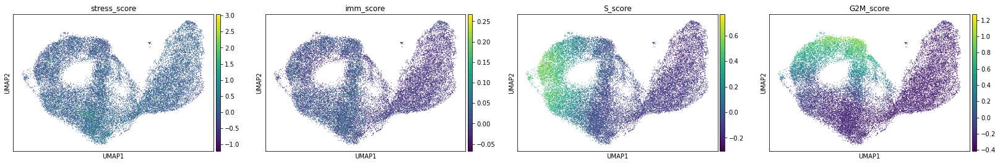

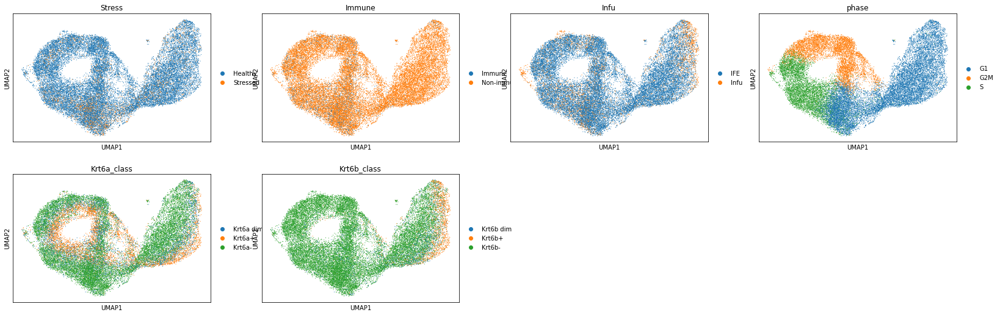

In [35]:
sc.pl.umap(adata, color = ['stress_score', 'imm_score', 'S_score', 'G2M_score'])
sc.pl.umap(adata, color = ['Stress', 'Immune', 'Infu', 'phase', 'Krt6a_class','Krt6b_class'])

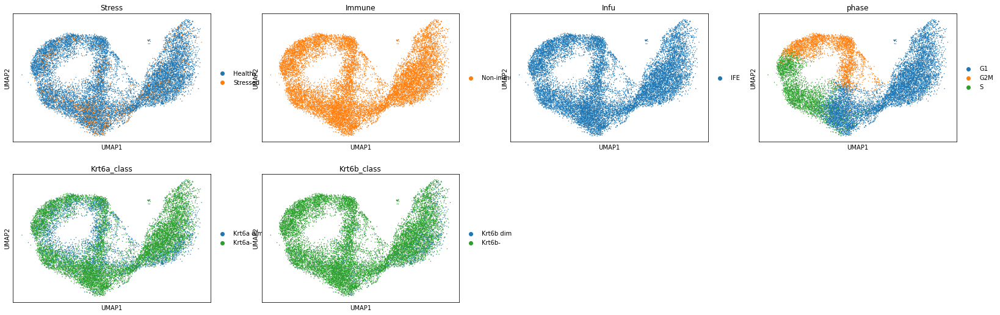

In [36]:
sc.pl.umap(adata[(adata.obs['Immune']!='Immune') & (adata.obs['Infu']!='Infu') & (adata.obs['Krt6a_class']!='Krt6a+') & (adata.obs['Krt6b_class']!='Krt6b+')],
           color = ['Stress', 'Immune', 'Infu', 'phase', 'Krt6a_class','Krt6b_class'])

In [37]:
adata = adata[(adata.obs['Immune']!='Immune') & (adata.obs['Infu']!='Infu') & (adata.obs['Krt6a_class']!='Krt6a+') & (adata.obs['Krt6b_class']!='Krt6b+')].copy()

In [38]:
HMU_IFE_cells_filtered = adata.obs_names
HMU_IFE_cells_filtered_obs = adata.obs.copy()

In [39]:
%store HMU_IFE_cells_filtered

Stored 'HMU_IFE_cells_filtered' (Index)


In [40]:
%store HMU_IFE_cells_filtered_obs

Stored 'HMU_IFE_cells_filtered_obs' (DataFrame)


# Reload data for integration

In [5]:
%store -r

In [6]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)[HMU_IFE_cells_filtered]
adata.obs = HMU_IFE_cells_filtered_obs

In [7]:
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [8]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

In [9]:
adata

AnnData object with n_obs × n_vars = 15397 × 18634
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo', 'S_score', 'G2M_score', 'phase', 'leiden', 'stress_score', 'imm_score', 'infu_score', 'Stress', 'Immune', 'Infu', 'Krt6a_class', 'Krt6b_class'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

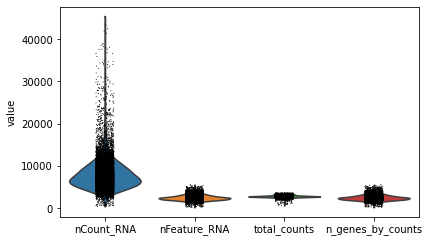

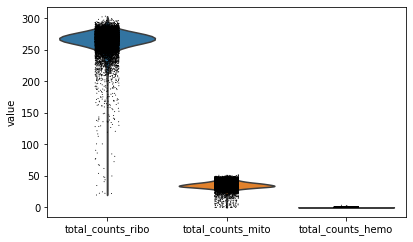

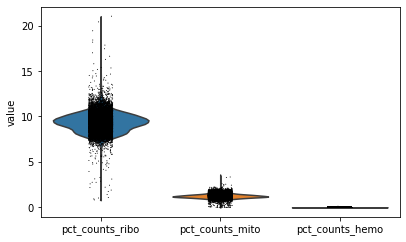

In [10]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

In [11]:
adata.raw = adata

In [12]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

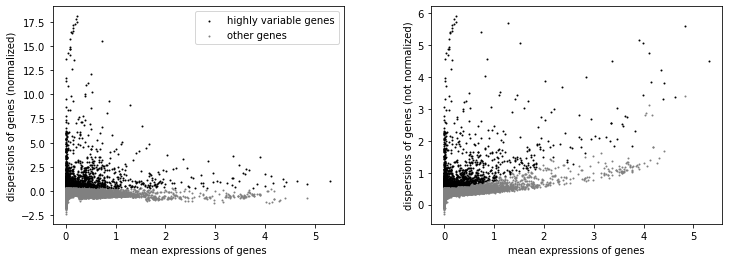

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.pl.highly_variable_genes(adata)

In [14]:
sc.pp.scale(adata)

In [15]:
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

In [16]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

... storing 'phase' as categorical


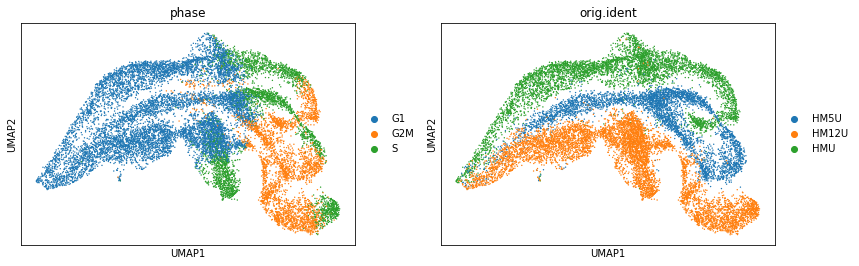

In [17]:
sc.pl.umap(adata, color = ['phase','orig.ident'])

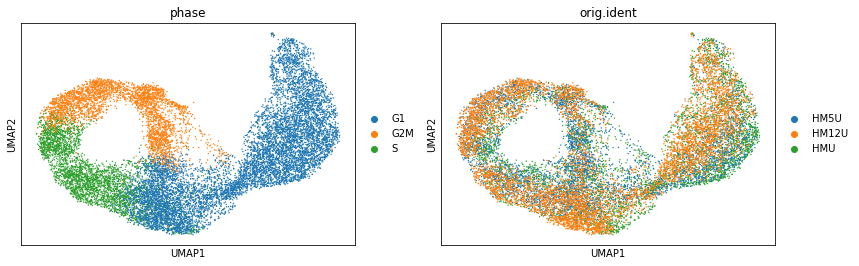

In [18]:
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['phase','orig.ident'])

In [20]:
sc.tl.leiden(adata, resolution = 0.3)

... storing 'seurat_clusters' as categorical


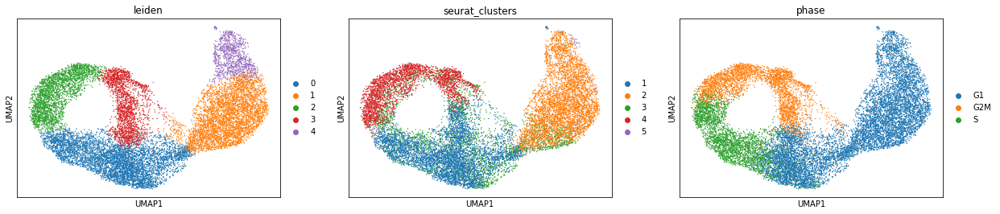

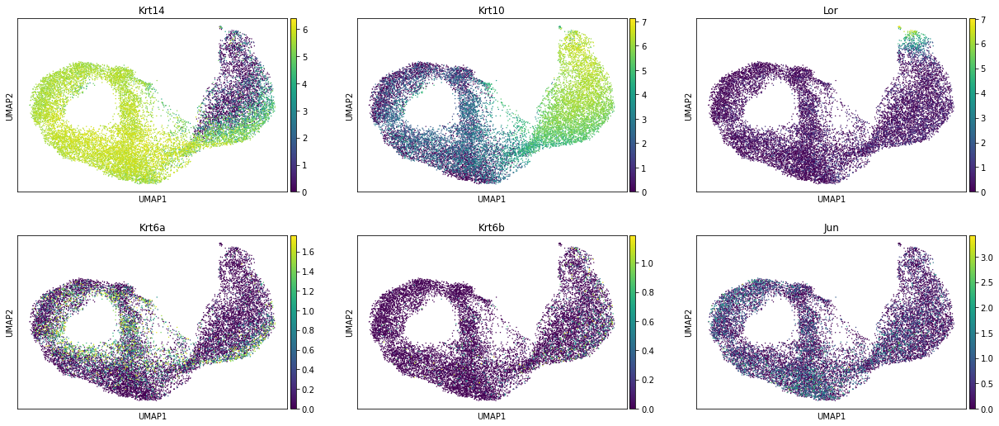

In [21]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase'])
sc.pl.umap(adata, color = ['Krt14','Krt10','Lor','Krt6a','Krt6b','Jun'], ncols = 3)

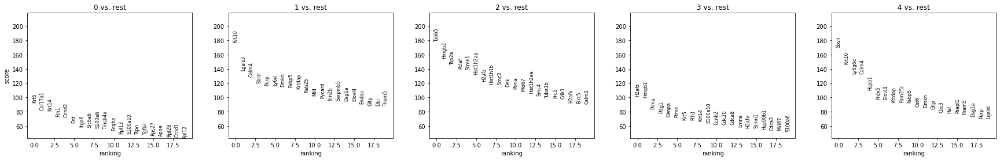

,0,1,2,3,4
0,Krt5,Krt10,Tubb5,H2afz,Sbsn
1,Col17a1,Lgals3,Hmgb2,Hmgb1,Krt10
2,Krt14,Calm4,Top2a,Ptma,Ly6g6c
3,Fth1,Sbsn,Pclaf,Pttg1,Calm4
4,Ccnd2,Perp,Stmn1,Cenpa,Hspb1
5,Dst,Ly6d,Hist1h2ap,Ptms,Prdx5
6,Itga6,Dmkn,H2afz,Krt5,Elovl4
7,Slc6a6,Fabp5,Hist1h1b,Fth1,Krtdap
8,S100a6,Krtdap,Smc2,Krt14,Fam25c
9,Tmsb4x,Rab25,Dek,S100a10,Fabp5


In [22]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# Integrate with main dataset

In [23]:
fig_path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Katie/Figure_output'.format(root)
path = '{}/Users/karlan/Google Drive/MKA/Epidermal stem cells at the point of no return/Sequencing results/Combined_With_Joost_IFE/'.format(root)
filename = '20201008_ingest_combined_imputed_cc-regressed'
raw_filename = '20200408_ingest_combined_imputed_cc-regressed'
raw_filename_downsampled = '20200415_ingest_combined_imputed_cc-regressed_downscaled'

sc.settings.figdir = fig_path

data_magic = sc.read_loom(os.path.join(path, '{}.loom'.format(filename)), obs_names = 'obs_names', var_names = 'var_names')

data_magic.raw = sc.read_csv(os.path.join(path, '{}_raw_counts.csv'.format(raw_filename_downsampled)))
    
with open(os.path.join(path, '{}_uns.pickle'.format(filename)), 'rb') as file:
    uns = pickle.load(file)
data_magic.uns = uns
for k in uns['neighbors'].keys():
    data_magic.uns['neighbors'][k] = uns['neighbors'][k]
    
b_sb_cutoff_old = data_magic[data_magic.obs['Location'] == 'Suprabasal'].obs['pto_coords'].min()
b_sb_cutoff = 0.8725141776937618

data_magic.obs['binned_delamination'] = pd.Categorical(data_magic.obs['binned_delamination'])

<ipython-input-23-6890bfaf8ee7>:17: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  data_magic.uns['neighbors'][k] = uns['neighbors'][k]
<ipython-input-23-6890bfaf8ee7>:17: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  data_magic.uns['neighbors'][k] = uns['neighbors'][k]
/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['distances'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData 

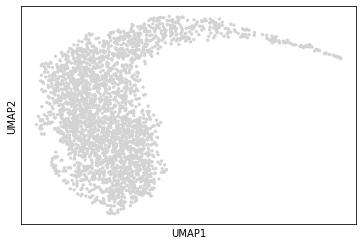

In [24]:
sc.pl.umap(data_magic)
clear_output()
sc.pl.umap(data_magic)

In [25]:
genes = data_magic.var_names.intersection(adata.var_names)
len(genes)

816

In [26]:
ingest_data = adata[:, genes].copy()
ingest_data = sc.tl.ingest(ingest_data[:, genes], adata_ref = data_magic[:, genes], obs = ['Location', 'binned_delamination', 'dpt_ordered', 'dpt_pseudotime'], inplace = False)

adata.obsm['X_umap_orig'] = adata.obsm['X_umap'].copy()
adata.obsm['X_umap_ingest'] = ingest_data[adata.obs_names].obsm['X_umap'].copy()
adata.obs = ingest_data[adata.obs_names].obs.copy()
del ingest_data
#adata = data_magic[:, genes].concatenate(adata, join = 'outer', batch_key = 'Exp')

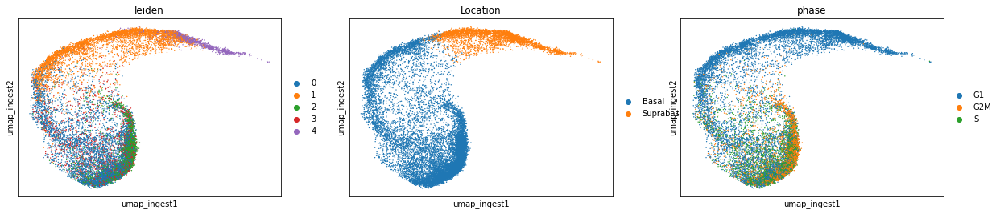

In [27]:
sc.pl.embedding(adata, basis = 'umap_ingest', color = ['leiden', 'Location', 'phase'])

In [28]:
adata.obs['dpt_ordered'] = adata.obs['dpt_ordered'].astype(float)
adata.obs['dpt_pseudotime'] = adata.obs['dpt_pseudotime'].astype(float)

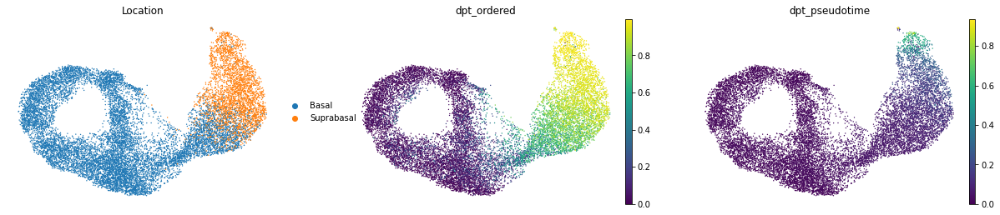

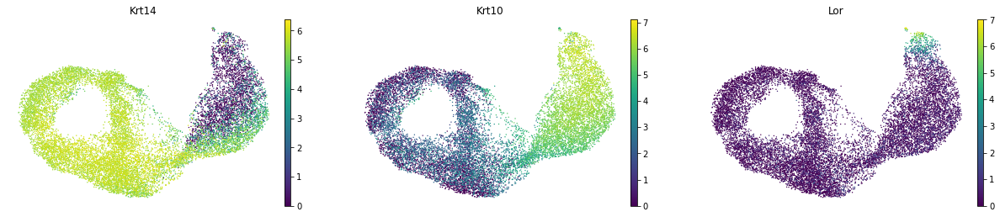

In [29]:
sc.pl.embedding(adata, basis = 'umap_orig', color = ['Location','dpt_ordered','dpt_pseudotime'], frameon = False)
sc.pl.embedding(adata, basis = 'umap_orig', color = ['Krt14','Krt10','Lor'], frameon = False)

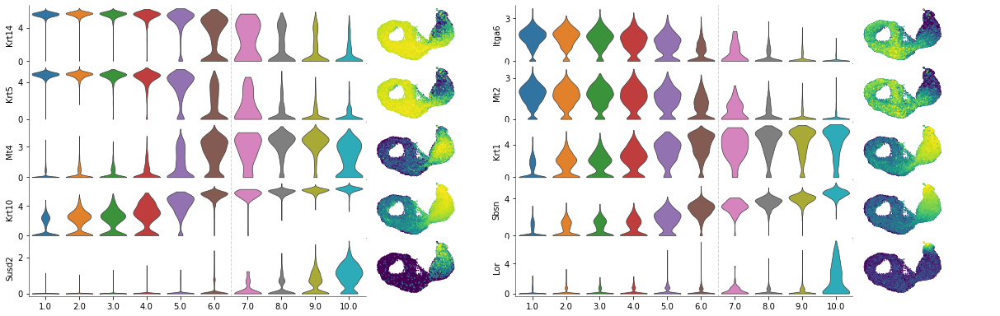

In [37]:
#Make nice looking violinplots + umaps

mpl.rcParams['axes.linewidth'] = 0.5
genes = ['Krt14', 'Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krt10', 'Sbsn', 'Susd2','Lor']

percentile = 99.9

cols = 2
ncols = 3*cols
fig, axes = initialize_subplots(groups_to_plot=len(genes)*3, ncols = ncols, figsize_multiplier=(3.5,1.3), 
                                gridspec_kw= {'hspace':0, 'wspace': 0.05, 'width_ratios': [4,1, 0.5]*cols})

plot = 0
for ix, gene in enumerate(genes):
    ax = get_ax(axes, plot, ncols)
    
    expr = adata.raw[:, gene].X.toarray().flatten()
    vmax = np.percentile(expr, q = percentile)
    
    #Violinplots
    sc.pl.violin(adata, keys = gene, groupby = 'binned_delamination', cut = 0, rotation = 0, ax = ax, show = False, stripplot = False, linewidth = 0.7, palette = 'tab10')
    
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 2))
    if ix < len(genes)-2:
        ax.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    

    ax.axvline(5.5, ls = '--', c = 'lightgrey', lw = 1)
    
    #Umaps
    plot+=1
    ax = get_ax(axes, plot, ncols)
    sc.pl.embedding(adata, basis = 'umap_orig', color = gene, ax = ax, show = False, frameon = False, title = '', s = 10, vmax = vmax)
    ax.set_ylim([ax.get_ylim()[0]-0.5, ax.get_ylim()[1]+0.5])
    # Remove umap colorbar
    ax.collections[-1].colorbar.remove()
    
    #Empty space for better separation
    plot+=1
    ax = get_ax(axes, plot, ncols)
    [ax.spines[spine].set_visible(False) for spine in ax.spines]
    ax.set_yticks([])
    ax.set_xticks([])
    plot+=1
    clear_output()
    
mpl.rcParams['axes.linewidth'] = 1

In [31]:
dpt_reordered = np.argsort(np.argsort(adata.obs['dpt_ordered']))
adata.obs['dpt_reordered'] = dpt_reordered/max(dpt_reordered)

(-5.73151039118166, 5.73151039118166)

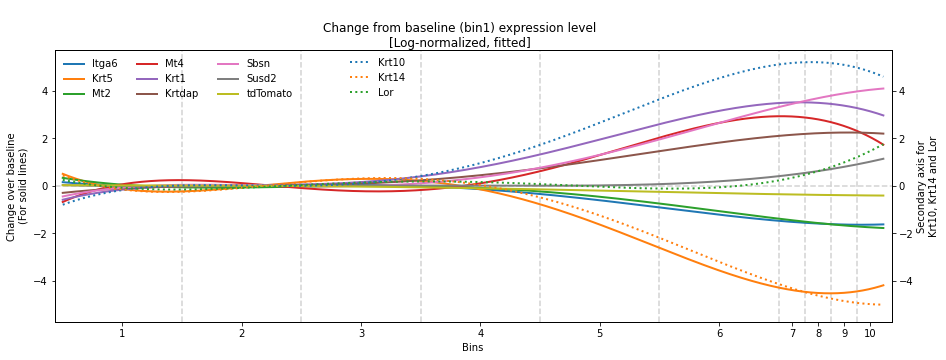

In [38]:
#Plot gene expression changes over pseudotime as compared to the mean expression in bin 1 (can also compare to other bins)

binning = 'binned_delamination'
dpt_group = 'dpt_reordered'

polyfit_deg = 4 #Degree for polynomial fit
chosen_bin = 1.0 #Which pin to compare the expression levels to

genes = ['Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krtdap','Sbsn', 'Susd2', 'tdTomato'] #Genes of interest to plot

rank = np.argsort(adata.obs[dpt_group])
dpt = adata[rank].obs[dpt_group].values

#Get bin borders from the reference dataset since they are better defined there
#Used only to draw the x-axis tick labels and vertical lines
bins = data_magic.obs.groupby(by = 'binned_delamination')['dpt_ordered'].min() 
bin_centers = []
for ix, b in enumerate(bins.values):
    if ix == 0:
        continue
    else:
        bin_centers.append((bins[ix-1]+b)/2)
bin_centers.append((1+bins[-1])/2) 

colors = sbn.color_palette(palette = 'tab10', n_colors = len(genes))

#Define plotting area
fig, ax = plt.subplots(figsize = (15, 5))
ax2 = ax.twinx() #Add a second y-axis

#Plot main genes
for ix, gene in enumerate(genes):
    expr = adata.raw[rank][:, gene].X.toarray().flatten()
    mean = expr[np.where(adata.obs[binning][rank]==chosen_bin)[0]].mean()
    p = np.poly1d(np.polyfit(dpt, expr, polyfit_deg))(dpt) #Polynomial fit over pseudotime
    ax.plot(dpt, #Pseudotime on x-axis
            p-mean, #fitted value - mean of chosen bin on y-axis
            ls = '-', lw = 2, c = colors[ix])
    clear_output(wait = True)

ax.legend(labels = list(genes), loc = 'upper left', ncol = 3, frameon = False) #Add legend entries for the first gens

genes = ['Krt10', 'Krt14', 'Lor'] #Descriptive genes plotted on the second axis
for gene in genes:
    expr = adata.raw[rank][:, gene].X.toarray().flatten()
    mean = expr[np.where(adata.obs[binning][rank]==chosen_bin)[0]].mean()
    p = np.poly1d(np.polyfit(dpt, expr, polyfit_deg))(dpt)
    ax2.plot(dpt, p-mean, ls = ':', lw = 2, zorder = -10)

ax2.legend(labels = ['Krt10','Krt14','Lor'], bbox_to_anchor = (0.43, 1.005), frameon = False)
[ax.axvline(l, c = 'lightgrey', ls = '--', zorder = 0, alpha = 1) for l in bins.values if l!=0] #Plot vertical lines for bin borders

#Beautify plot
ax.set_xlim([-0.01, 1.01])
ax.set_xticks(bin_centers)
ax.set_xticklabels(np.arange(1,11))
fig.suptitle('\nChange from baseline (bin1) expression level\n[Log-normalized, fitted]', y = 1)
ax.set_ylabel('Change over baseline\n(For solid lines)')
ax2.set_ylabel('Secondary axis for\nKrt10, Krt14 and Lor')
ax.set_xlabel('Bins')
ax.axhline(0, ls = '--', c = 'lightgrey', zorder = -1)

#Make both y-axes the same
ylim = max([max(map(abs, ax.get_ylim())), max(map(abs, ax2.get_ylim()))])
ax.set_ylim([-ylim, ylim])
ax2.set_ylim([-ylim, ylim])

In [33]:
adata.obs['Commitment'] = ['Basal non-committed' if x in [1,2,3] else 'Delaminated' if x in [7,8,9,10] else 'Basal committed' for x in adata.obs['binned_delamination']]

... storing 'Commitment' as categorical


<AxesSubplot:title={'center':'Commitment'}, xlabel='umap_ingest1', ylabel='umap_ingest2'>

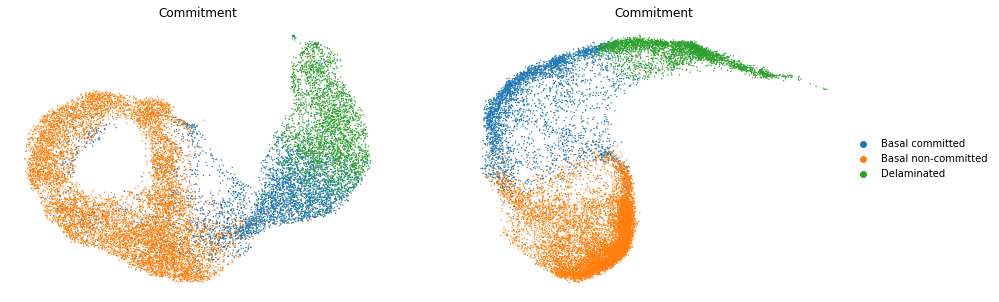

In [34]:
fig, axes = plt.subplots(ncols = 2, figsize = (15, 5))
sc.pl.embedding(adata, color = 'Commitment', basis = 'umap_orig', ax = axes[0], show = False, frameon = False, legend_loc = False)
sc.pl.embedding(adata, color = 'Commitment', basis = 'umap_ingest', ax = axes[1], show = False, frameon = False)

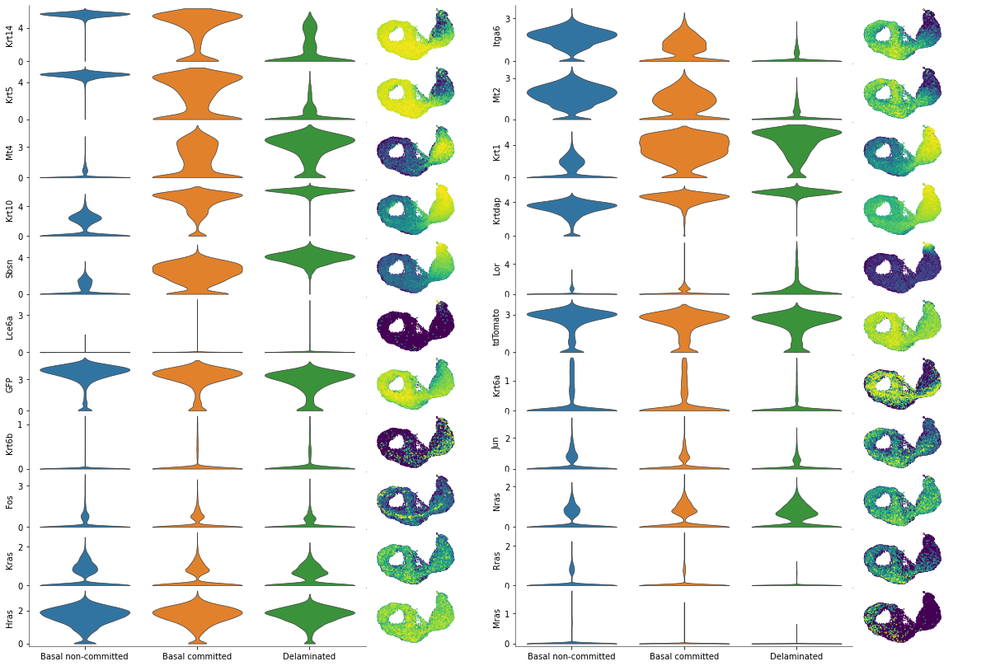

In [39]:
#Plot gene expression violinplots for commitment annotation
mpl.rcParams['axes.linewidth'] = 0.5
genes = ['Krt14', 'Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krt10', 'Krtdap', 'Sbsn', 'Lor', 'Lce6a', 'tdTomato', 'GFP', 'Krt6a','Krt6b','Jun','Fos', 'Nras','Kras','Rras','Hras','Mras']

percentile = 99.9

cols = 2
ncols = 3*cols
fig, axes = initialize_subplots(groups_to_plot=len(genes)*3, ncols = ncols, figsize_multiplier=(3.5,1.3), 
                                gridspec_kw= {'hspace':0, 'wspace': 0.05, 'width_ratios': [4,1, 0.5]*cols})

plot = 0
for ix, gene in enumerate(genes):
    ax = get_ax(axes, plot, ncols)
    
    expr = adata.raw[:, gene].X.toarray().flatten()
    vmax = np.percentile(expr, q = percentile)
    
    sc.pl.violin(adata, keys = gene, groupby = 'Commitment', cut = 0, rotation = 0, ax = ax, show = False, stripplot = False, linewidth = 0.7, 
                 palette = 'tab10', order = ['Basal non-committed', 'Basal committed', 'Delaminated'])
    
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 2))
    if ix < len(genes)-2:
        ax.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    plot+=1
    ax = get_ax(axes, plot, ncols)
    sc.pl.embedding(adata, basis = 'umap_orig', color = gene, ax = ax, show = False, frameon = False, title = '', s = 10, vmax = vmax)
    ax.set_ylim([ax.get_ylim()[0]-0.5, ax.get_ylim()[1]+0.5])
    # Remove umap colorbar
    ax.collections[-1].colorbar.remove()
    
    plot+=1
    ax = get_ax(axes, plot, ncols)
    [ax.spines[spine].set_visible(False) for spine in ax.spines]
    ax.set_yticks([])
    ax.set_xticks([])
    plot+=1
    clear_output()
    
mpl.rcParams['axes.linewidth'] = 1

# Classify tdTomato and GFP

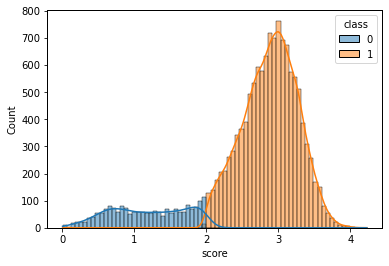

In [40]:
x = adata.raw[:, 'tdTomato'].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0]
x = adata.raw[pos_cells][:, 'tdTomato'].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

#adata.obs['Tomato'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy')
adata.obs['Tomato_class'] = ['Tom-' if x not in tmp.index else 'Tom dim' if tmp.loc[x, 'class']==0 else 'Tom+' for x in adata.obs_names]

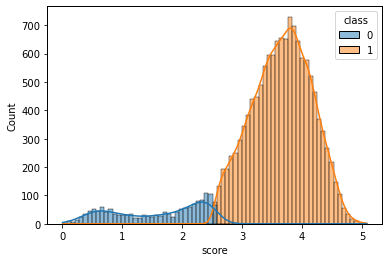

In [41]:
x = adata.raw[:, 'GFP'].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0]
x = adata.raw[pos_cells][:, 'GFP'].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

#adata.obs['Tomato'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy')
adata.obs['GFP_class'] = ['GFP-' if x not in tmp.index else 'GFP dim' if tmp.loc[x, 'class']==0 else 'GFP+' for x in adata.obs_names]

... storing 'Tomato_class' as categorical
... storing 'GFP_class' as categorical


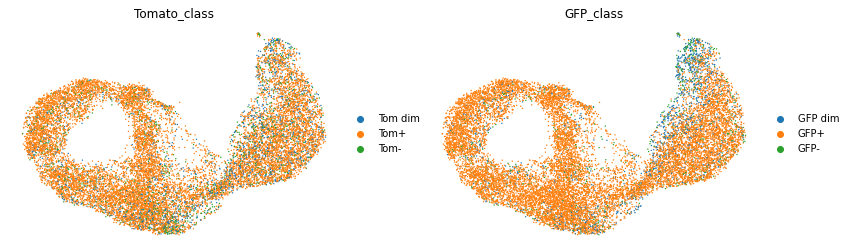

In [42]:
sc.pl.umap(adata, color = ['Tomato_class', 'GFP_class'], frameon = False)

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_over('black')
/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_under('lightgray')
/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: Matplo

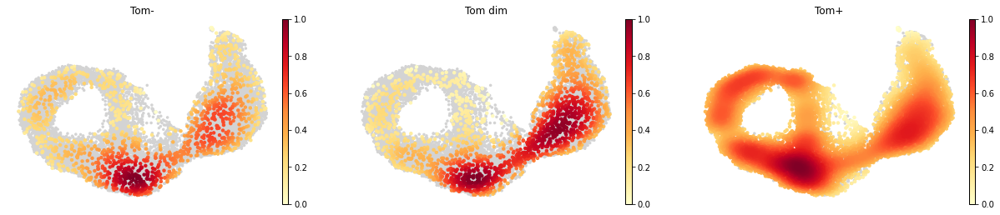

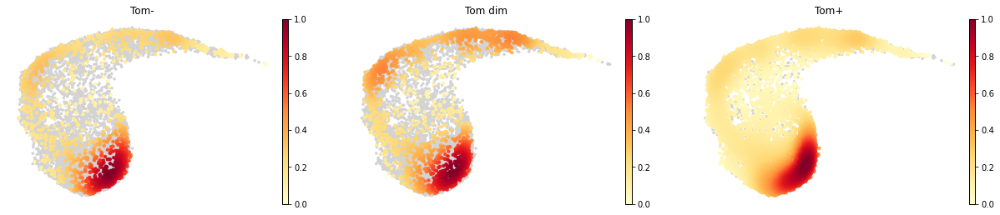

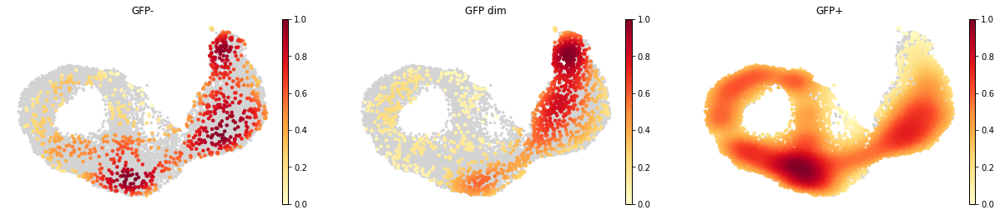

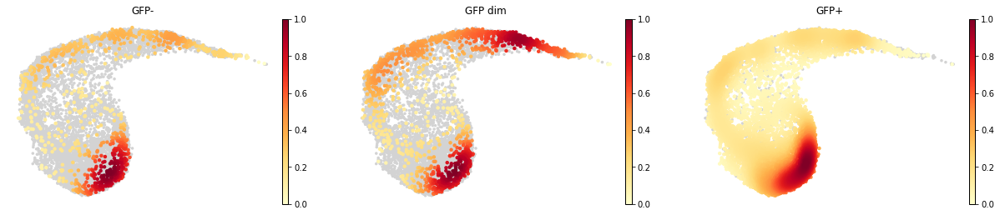

In [44]:
bg_dotsize = 50
fg_dotsize = 80
for g in ['Tomato_class', 'GFP_class']:
    sc.tl.embedding_density(adata, groupby = g, basis = 'umap')
    sc.tl.embedding_density(adata, groupby = g, basis = 'umap_ingest')
    group = ['Tom-','Tom dim','Tom+'] if 'Tomato' in g else ['GFP-','GFP dim','GFP+']
    sc.pl.embedding_density(adata, key = 'umap_density_{}'.format(g), basis = 'umap', frameon = False, group = group, bg_dotsize = bg_dotsize, fg_dotsize = fg_dotsize)
    sc.pl.embedding_density(adata, key = 'umap_ingest_density_{}'.format(g), basis = 'umap_ingest', frameon = False, group = group, bg_dotsize = bg_dotsize, fg_dotsize = fg_dotsize)
    print('\n'*5 if 'Tomato' in g else '')

# Save loom file

In [6]:
path = '/mnt/g/My Drive/MKA/Papers/Greco/Sara and Nur/Loom files/Processed'.format(root)